Cloning into 'stylegan3'...
remote: Enumerating objects: 212, done.
remote: Counting objects: 100% (166/166), done.
remote: Compressing objects: 100% (70/70), done.
remote: Total 212 (delta 101), reused 96 (delta 96), pack-reused 46 (from 1)
Receiving objects: 100% (212/212), 4.16 MiB | 9.06 MiB/s, done.
Resolving deltas: 100% (107/107), done.
/content/stylegan3/stylegan3
--2025-05-14 15:49:44--  https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-r-ffhq-1024x1024.pkl
Resolving api.ngc.nvidia.com (api.ngc.nvidia.com)... 54.203.101.202, 52.10.4.28
Connecting to api.ngc.nvidia.com (api.ngc.nvidia.com)|54.203.101.202|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://xfiles.ngc.nvidia.com/org/nvidia/team/research/models/stylegan3/versions/1/files/stylegan3-r-ffhq-1024x1024.pkl?ssec-algo=AES256&versionId=TeYeXdGjgFpP7pl3NhWJU_7jbgZcw3Mp&ssec-key=Zu%2BA9oNXSxIk8Tl42S3uOg4rAl%2BFvQWr1A4tX6amWQuO14hhCeMUCxsgZjsMxGBNcHp%

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Grid saved to output/image_grid.png


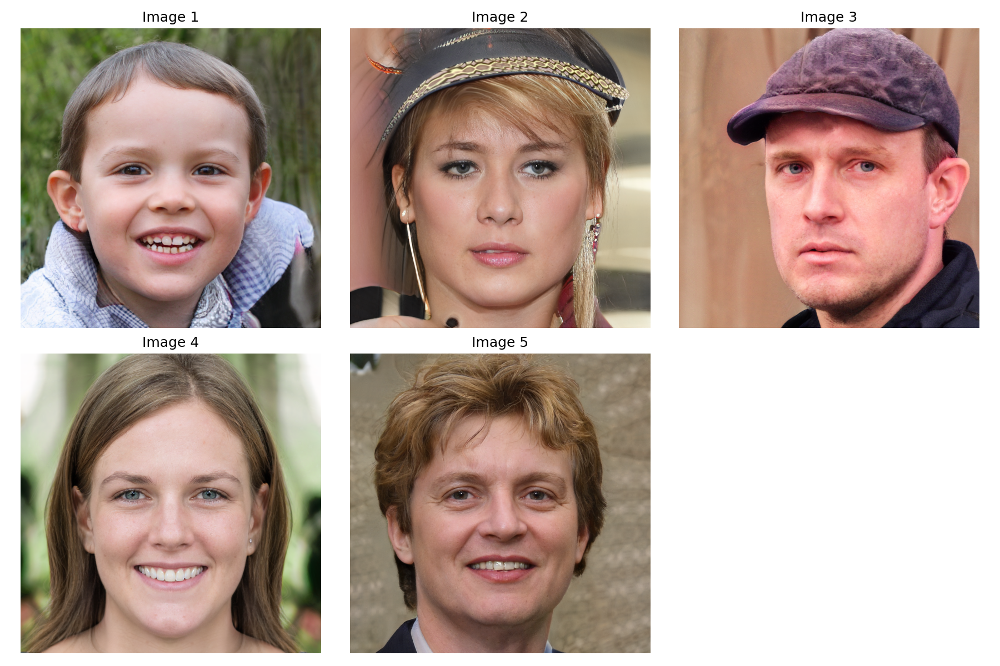

Generating 1 images with seed 0 and truncation_psi 0.3...
Saved output/seed0000_img00.png
Generating 1 images with seed 0 and truncation_psi 0.5...
Saved output/seed0000_img00.png
Generating 1 images with seed 0 and truncation_psi 0.7...
Saved output/seed0000_img00.png
Generating 1 images with seed 0 and truncation_psi 1.0...
Saved output/seed0000_img00.png
updating: content/stylegan3/output/ (stored 0%)
updating: content/stylegan3/output/seed0042_img03.png (deflated 0%)
updating: content/stylegan3/output/seed0042_img04.png (deflated 0%)
updating: content/stylegan3/output/seed0000_img00.png (deflated 0%)
updating: content/stylegan3/output/seed0042_img01.png (deflated 0%)
updating: content/stylegan3/output/image_grid.png (deflated 0%)
updating: content/stylegan3/output/seed0042_img02.png (deflated 0%)
updating: content/stylegan3/output/seed0042_img00.png (deflated 0%)
  adding: content/stylegan3/output/mix_40_15_r9_c5.png (deflated 0%)
  adding: content/stylegan3/output/interp_100_200_0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saved output/interp_100_200_00.png
Saved output/interp_100_200_01.png
Saved output/interp_100_200_02.png
Saved output/interp_100_200_03.png
Saved output/interp_100_200_04.png
Saved output/interp_100_200_05.png
Saved output/interp_100_200_06.png
Saved output/interp_100_200_07.png
Saved output/interp_100_200_08.png
Saved output/interp_100_200_09.png
Saved output/interp_100_200_10.png


<ipython-input-6-4baf9a624c60>:151: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(img_path))


Saved interpolation GIF to output/interp_100_200.gif


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Generating latent samples for PCA visualization...
PCA visualization saved to output/latent_pca.png
PCA with samples visualization saved to output/latent_pca_with_samples.png
Grid saved to output/image_grid.png


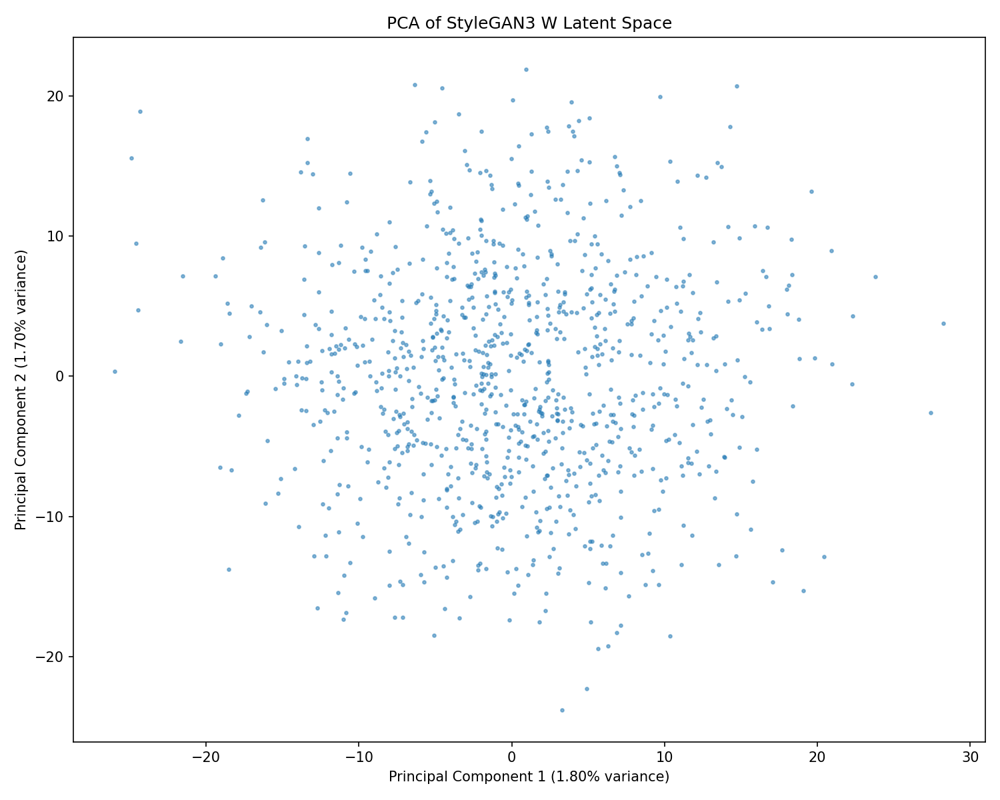

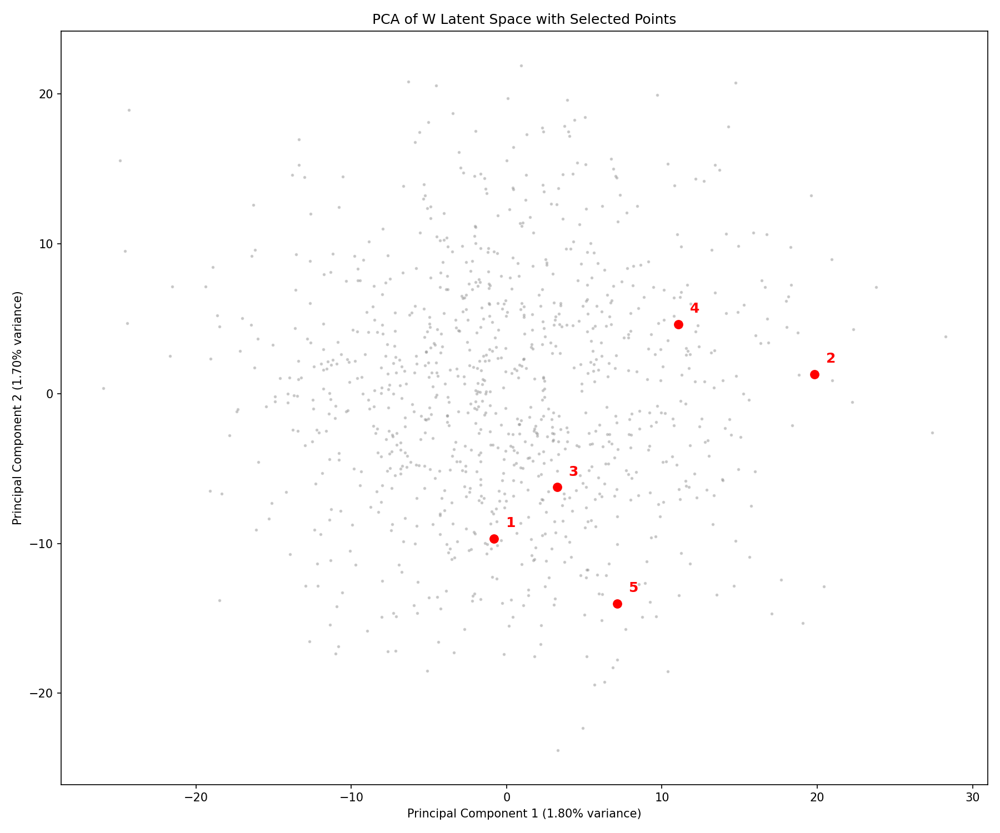

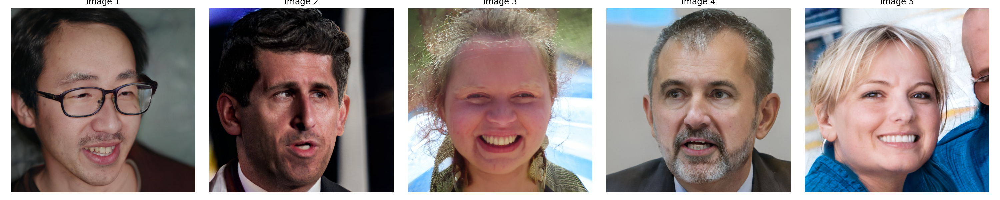

Generating style mixing visualization...
Generating 49 style mixtures...
Style mixing visualization saved to output/style_mixing_40_15.png


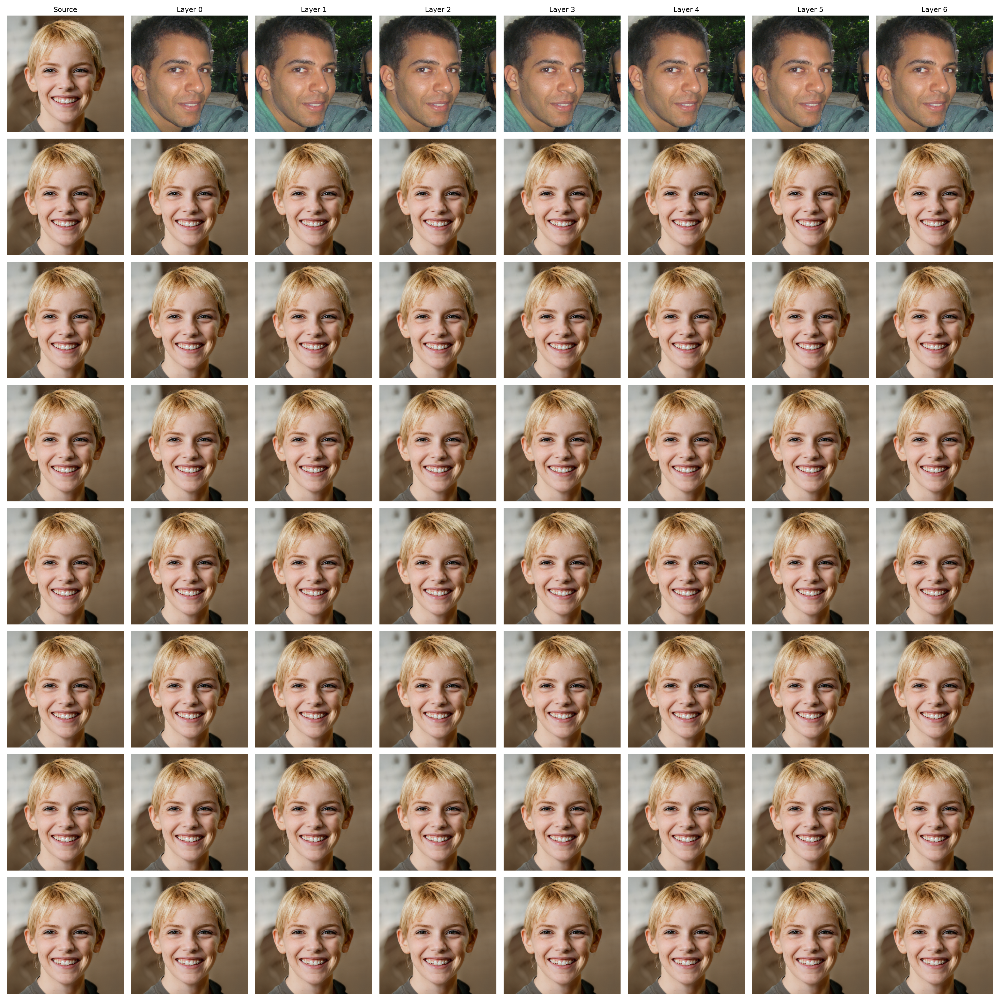

Visualizing network features...
Network architecture visualization saved to output/stylegan3_architecture.png


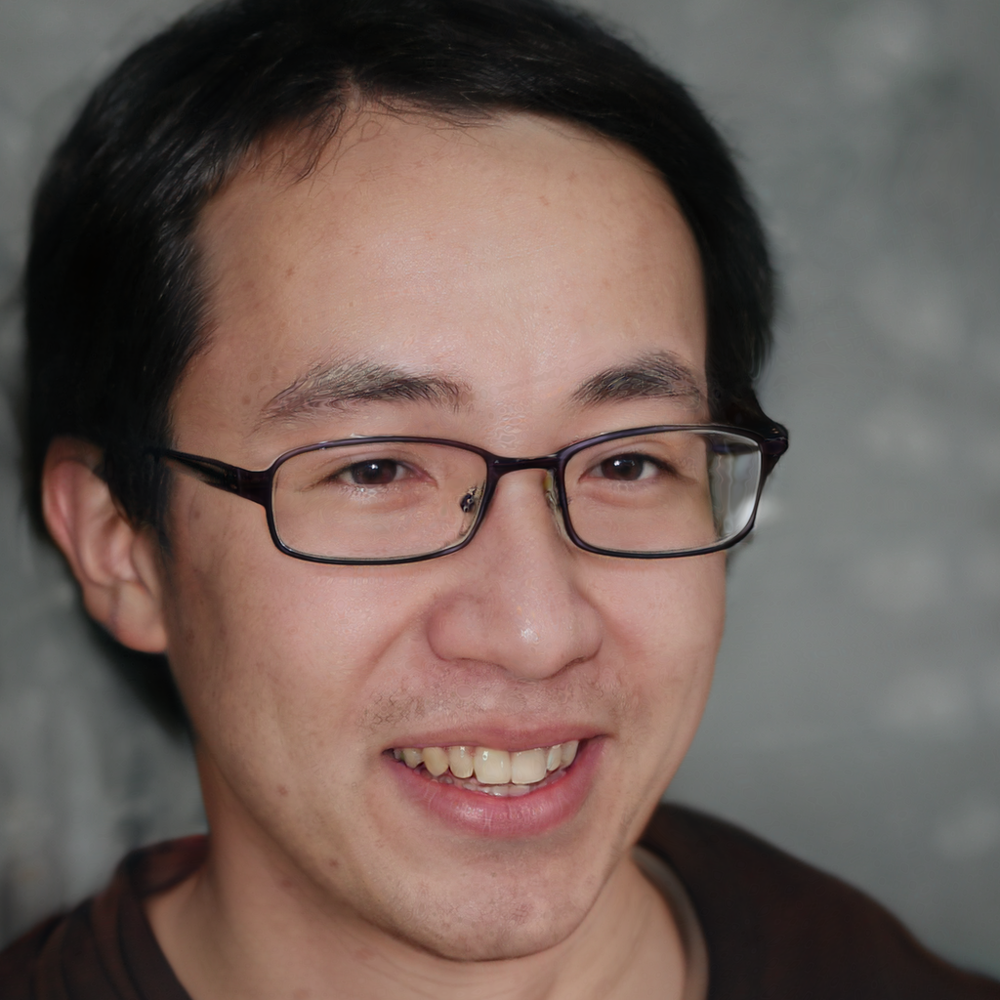

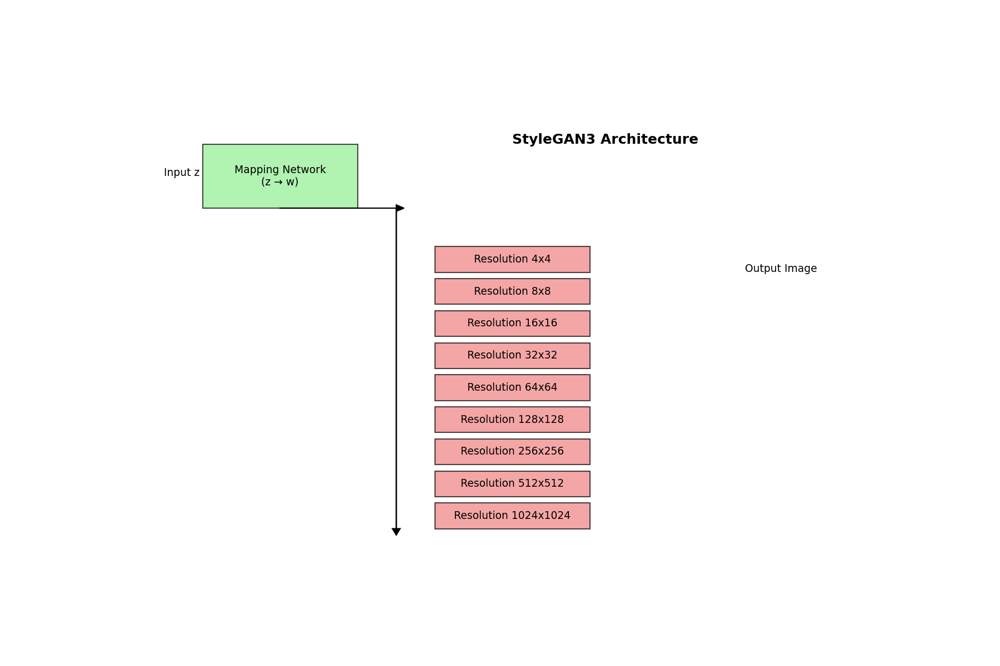

Interactive face generator - adjust parameters and click 'Generate Face'


RuntimeError: The size of tensor a (512) must match the size of tensor b (14) at non-singleton dimension 1

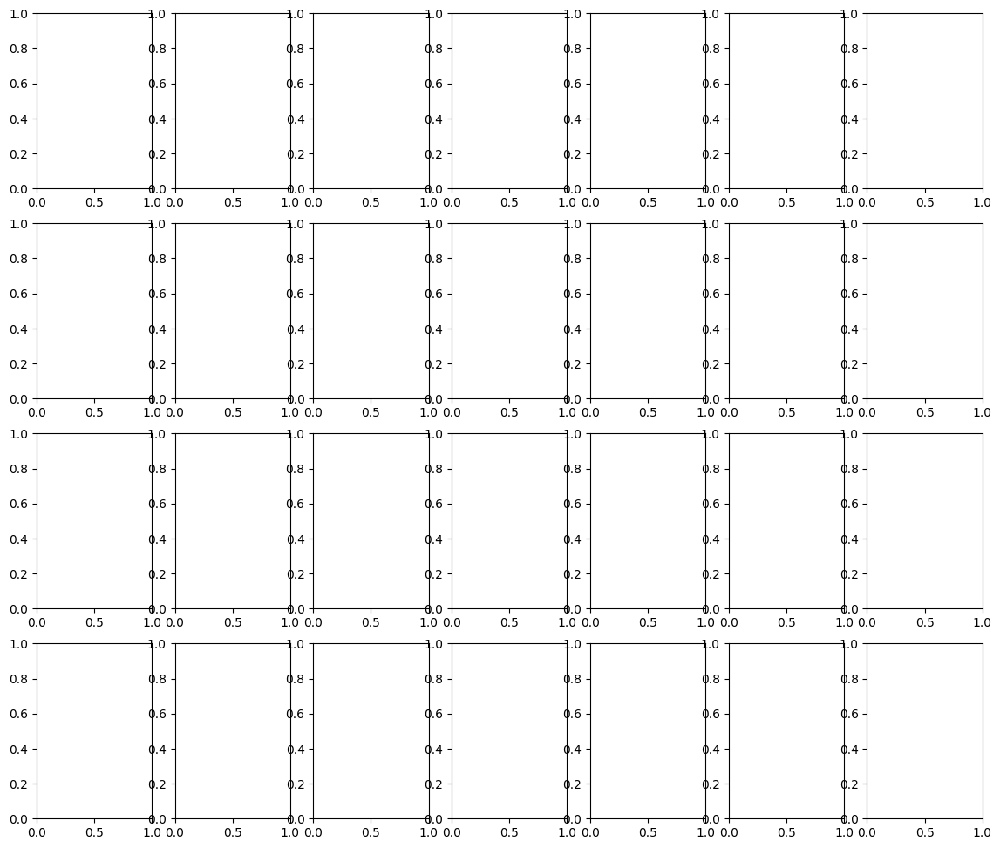

In [ ]:

# 1. Install dependencies
!pip install ninja imageio pillow matplotlib
!pip install torch torchvision torchaudio
!pip install click requests tqdm pyspng scikit-learn
!pip install opencv-python ipywidgets

# 2. Clone the StyleGAN3 repository
!git clone https://github.com/NVlabs/stylegan3.git
%cd stylegan3

# 3. Download pretrained model weights for faces (FFHQ)
!wget https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/stylegan3-r-ffhq-1024x1024.pkl -P checkpoints/

# 4. Let's generate some faces
import pickle
import numpy as np
import torch
import dnnlib
import legacy
from PIL import Image
import os
from google.colab import files
from matplotlib import pyplot as plt


# Set up the output directory
os.makedirs('output', exist_ok=True)

# Load pretrained model
network_pkl = 'checkpoints/stylegan3-r-ffhq-1024x1024.pkl'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Loading networks from "{network_pkl}"...')

with open(network_pkl, 'rb') as f:
    G = pickle.load(f)['G_ema'].to(device)

# Function to generate images
def generate_images(num_images=5, seed=None, truncation_psi=0.7):
    """Generate images using the pretrained model.

    Args:
        num_images: Number of images to generate
        seed: Random seed for reproducibility
        truncation_psi: Controls variation. Lower values = less variation but higher quality
    """
    if seed is None:
        seed = np.random.randint(0, 100000)

    # Generate random latent vectors
    z = torch.randn(num_images, G.z_dim).to(device)

    # Generate images from latent vectors
    print(f'Generating {num_images} images with seed {seed} and truncation_psi {truncation_psi}...')
    label = torch.zeros([num_images, G.c_dim], device=device)

    # Use truncation trick
    ws = G.mapping(z, label, truncation_psi=truncation_psi)
    images = G.synthesis(ws)

    # Convert to numpy images
    images = (images.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()

    # Save images
    for i, img in enumerate(images):
        filename = f'output/seed{seed:04d}_img{i:02d}.png'
        Image.fromarray(img).save(filename)
        print(f'Saved {filename}')

    return images

# Generate some faces
images = generate_images(num_images=5, seed=42, truncation_psi=0.7)

# Download the generated images
!zip -r /content/generated_faces.zip /content/stylegan3/output
files.download('/content/generated_faces.zip')

# Create a grid visualization of generated images
def create_image_grid(images, rows=2, cols=None):
    """Create a grid from multiple images"""
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec

    n = len(images)
    if cols is None:
        cols = (n + rows - 1) // rows

    fig = plt.figure(figsize=(cols*4, rows*4))
    gs = GridSpec(rows, cols)

    for i, img in enumerate(images):
        if i < n:
            ax = fig.add_subplot(gs[i // cols, i % cols])
            ax.imshow(img)
            ax.set_title(f"Image {i+1}")
            ax.axis('off')

    plt.tight_layout()
    grid_path = 'output/image_grid.png'
    plt.savefig(grid_path, dpi=150)
    plt.close()
    print(f"Grid saved to {grid_path}")
    return grid_path

# Show the grid of generated images
grid_path = create_image_grid(images)
from IPython.display import Image as IPImage
display(IPImage(grid_path))

# Optional: Function to generate grid of images with different truncation values
def generate_truncation_series(num_seeds=1, truncation_values=[0.3, 0.5, 0.7, 1.0]):
    """Generate series of images with different truncation values."""
    for seed in range(num_seeds):
        for psi in truncation_values:
            generate_images(num_images=1, seed=seed, truncation_psi=psi)

    # Download all images
    !zip -r /content/truncation_series.zip /content/stylegan3/output
    files.download('/content/truncation_series.zip')

# Uncomment to generate truncation series
generate_truncation_series()

# Optional: Generate interpolation between two random seeds
def generate_interpolation(seed1=42, seed2=43, steps=10, truncation_psi=0.7):
    """Generate interpolation between two random seeds."""
    # Generate latent vectors
    torch.manual_seed(seed1)
    z1 = torch.randn(1, G.z_dim, device=device)
    torch.manual_seed(seed2)
    z2 = torch.randn(1, G.z_dim, device=device)

    # Generate interpolated latents
    label = torch.zeros([1, G.c_dim], device=device)

    for i in range(steps + 1):
        alpha = i / steps
        z_interp = (1 - alpha) * z1 + alpha * z2
        ws = G.mapping(z_interp, label, truncation_psi=truncation_psi)
        img = G.synthesis(ws)
        img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()[0]
        filename = f'output/interp_{seed1}_{seed2}_{i:02d}.png'
        Image.fromarray(img).save(filename)
        print(f'Saved {filename}')

    # Create a GIF from the interpolation
    import imageio
    images = []
    for i in range(steps + 1):
        img_path = f'output/interp_{seed1}_{seed2}_{i:02d}.png'
        images.append(imageio.imread(img_path))

    # Add reverse for smooth loop
    images.extend(images[::-1])

    # Save as GIF
    gif_path = f'output/interp_{seed1}_{seed2}.gif'
    imageio.mimsave(gif_path, images, duration=0.2)
    print(f'Saved interpolation GIF to {gif_path}')
    files.download(gif_path)

# Uncomment to generate interpolation
generate_interpolation(seed1=100, seed2=200, steps=10)

# Visualization of the latent space using PCA
def visualize_latent_space(num_samples=1000, seed=42):
    """Generate samples and visualize the latent space using PCA"""
    from sklearn.decomposition import PCA
    import matplotlib.pyplot as plt

    print("Generating latent samples for PCA visualization...")

    # Set random seed for reproducibility
    torch.manual_seed(seed)

    # Generate random latent vectors
    z = torch.randn(num_samples, G.z_dim).to(device)
    label = torch.zeros([num_samples, G.c_dim], device=device)

    # Get W space latents
    with torch.no_grad():
        w = G.mapping(z, label)

    # Move to CPU and convert to numpy for PCA
    w_np = w.cpu().numpy()

    # Reshape to 2D array (samples x features)
    w_np_2d = w_np.reshape(num_samples, -1)

    # Apply PCA
    pca = PCA(n_components=2)
    w_pca = pca.fit_transform(w_np_2d)

    # Create scatter plot
    plt.figure(figsize=(10, 8))
    plt.scatter(w_pca[:, 0], w_pca[:, 1], alpha=0.5, s=5)
    plt.title('PCA of StyleGAN3 W Latent Space')
    plt.xlabel(f'Principal Component 1 ({pca.explained_variance_ratio_[0]:.2%} variance)')
    plt.ylabel(f'Principal Component 2 ({pca.explained_variance_ratio_[1]:.2%} variance)')
    plt.tight_layout()

    # Save figure
    pca_path = 'output/latent_pca.png'
    plt.savefig(pca_path, dpi=150)
    plt.close()
    print(f"PCA visualization saved to {pca_path}")

    # Generate images for selected points to visualize relationships
    num_points = 5
    selected_indices = np.linspace(0, num_samples-1, num_points).astype(int)

    # Generate images for selected points
    selected_images = []
    for idx in selected_indices:
        # Get latent vector
        w_selected = torch.tensor(w_np[idx:idx+1]).to(device)
        # Generate image
        img = G.synthesis(w_selected)
        img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()[0]
        selected_images.append(img)
        # Save image
        filename = f'output/pca_sample_{idx}.png'
        Image.fromarray(img).save(filename)

    # Visualize selected points on PCA plot with thumbnails
    plt.figure(figsize=(12, 10))
    plt.scatter(w_pca[:, 0], w_pca[:, 1], alpha=0.3, s=3, color='gray')

    # Mark selected points
    plt.scatter(w_pca[selected_indices, 0], w_pca[selected_indices, 1], s=50, color='red')

    for i, idx in enumerate(selected_indices):
        plt.annotate(f"{i+1}", (w_pca[idx, 0], w_pca[idx, 1]),
                   xytext=(10, 10), textcoords='offset points',
                   color='red', fontsize=12, weight='bold')

    plt.title('PCA of W Latent Space with Selected Points')
    plt.xlabel(f'Principal Component 1 ({pca.explained_variance_ratio_[0]:.2%} variance)')
    plt.ylabel(f'Principal Component 2 ({pca.explained_variance_ratio_[1]:.2%} variance)')
    plt.tight_layout()

    # Save figure
    pca_samples_path = 'output/latent_pca_with_samples.png'
    plt.savefig(pca_samples_path, dpi=150)
    plt.close()
    print(f"PCA with samples visualization saved to {pca_samples_path}")

    # Create a grid with the selected images
    grid_path = create_image_grid(selected_images, rows=1, cols=num_points)

    # Return for display
    return pca_path, pca_samples_path, grid_path

# Uncomment to visualize latent space
pca_path, pca_samples_path, grid_path = visualize_latent_space(num_samples=1000)
display(IPImage(pca_path))
display(IPImage(pca_samples_path))
display(IPImage(grid_path))

# Style mixing visualization
def style_mixing(seed_src=40, seed_dst=15, col_styles=[0,1,2,3,4,5,6], row_styles=[7,8,9,10,11,12,13], truncation_psi=0.7):
    """Generate a style mixing visualization between two seeds"""
    import matplotlib.pyplot as plt

    print(f"Generating style mixing visualization...")

    # Source and destination seeds
    torch.manual_seed(seed_src)
    z_src = torch.randn(1, G.z_dim).to(device)

    torch.manual_seed(seed_dst)
    z_dst = torch.randn(1, G.z_dim).to(device)

    label = torch.zeros([1, G.c_dim], device=device)

    # Get W vectors
    src_w = G.mapping(z_src, label, truncation_psi=truncation_psi)
    dst_w = G.mapping(z_dst, label, truncation_psi=truncation_psi)

    # Generate original images
    src_img = G.synthesis(src_w)
    src_img = (src_img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()[0]

    dst_img = G.synthesis(dst_w)
    dst_img = (dst_img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()[0]

    # Save original images
    Image.fromarray(src_img).save(f'output/mix_src_{seed_src}.png')
    Image.fromarray(dst_img).save(f'output/mix_dst_{seed_dst}.png')

    # Style mixing matrix
    num_rows = len(row_styles) + 1  # +1 for source image
    num_cols = len(col_styles) + 1  # +1 for destination image

    # Create figure
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*3, num_rows*3))

    # Place source image in top-left
    axs[0, 0].imshow(src_img)
    axs[0, 0].set_title('Source')
    axs[0, 0].axis('off')

    # Place destination labels on top row
    for i, col_style in enumerate(col_styles):
        axs[0, i+1].imshow(dst_img)
        axs[0, i+1].set_title(f'Layer {col_style}')
        axs[0, i+1].axis('off')

    # Place source labels on first column
    for i, row_style in enumerate(row_styles):
        axs[i+1, 0].imshow(src_img)
        axs[i+1, 0].set_ylabel(f'Layer {row_style}', rotation=90, size='large')
        axs[i+1, 0].axis('off')

    # Generate mixed images
    print(f"Generating {len(row_styles) * len(col_styles)} style mixtures...")
    for row_idx, row_style in enumerate(row_styles):
        for col_idx, col_style in enumerate(col_styles):
            # Copy source w
            mixed_w = src_w.clone()

            # Mix in destination w for specific layers
            mixed_w[:, row_style:col_style+1] = dst_w[:, row_style:col_style+1]

            # Generate mixed image
            mixed_img = G.synthesis(mixed_w)
            mixed_img = (mixed_img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()[0]

            # Display in grid
            axs[row_idx+1, col_idx+1].imshow(mixed_img)
            axs[row_idx+1, col_idx+1].axis('off')

            # Save individual image
            Image.fromarray(mixed_img).save(f'output/mix_{seed_src}_{seed_dst}_r{row_style}_c{col_style}.png')

    plt.tight_layout()
    style_mix_path = f'output/style_mixing_{seed_src}_{seed_dst}.png'
    plt.savefig(style_mix_path, dpi=150)
    plt.close()
    print(f"Style mixing visualization saved to {style_mix_path}")
    return style_mix_path

# Uncomment to generate style mixing visualization
style_mix_path = style_mixing(seed_src=40, seed_dst=15)
display(IPImage(style_mix_path))

# Feature visualization of StyleGAN3 network layers
def visualize_network_features(seed=42, truncation_psi=0.7):
    """Visualize activations from different layers of the network"""
    import cv2

    print("Visualizing network features...")

    # Generate a sample latent vector
    torch.manual_seed(seed)
    z = torch.randn(1, G.z_dim).to(device)
    label = torch.zeros([1, G.c_dim], device=device)

    # Get W vector
    w = G.mapping(z, label, truncation_psi=truncation_psi)

    # Get network structure
    synthesis_kwargs = {
        'noise_mode': 'const',
        'force_fp32': True,
    }

    # Hook to capture intermediate layer outputs
    layer_outputs = {}
    hooks = []

    # Extract layers we want to visualize (simplifying to avoid complexity)
    # This is a simplified approach for StyleGAN3 - we'll visualize key layers

    # Generate the image and collect activations
    with torch.no_grad():
        img = G.synthesis(w, **synthesis_kwargs)

    # Convert image to numpy
    img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()[0]

    # Save the image
    Image.fromarray(img).save(f'output/network_vis_seed{seed}.png')

    # Create a diagram of the StyleGAN3 architecture
    plt.figure(figsize=(12, 8))

    # Draw a simplified diagram of StyleGAN3
    def draw_box(x, y, width, height, label, color='lightblue'):
        rect = plt.Rectangle((x, y), width, height, facecolor=color, edgecolor='black', alpha=0.7)
        plt.gca().add_patch(rect)
        plt.text(x + width/2, y + height/2, label, ha='center', va='center', fontsize=9)

    # Draw the basic architecture components
    plt.xlim(0, 10)
    plt.ylim(0, 8)

    # Mapping Network
    draw_box(1, 6, 2, 1, 'Mapping Network\n(z → w)', color='lightgreen')

    # Synthesis Network blocks at different resolutions
    resolutions = [4, 8, 16, 32, 64, 128, 256, 512, 1024]
    for i, res in enumerate(resolutions):
        y_pos = 5 - (i * 0.5)
        draw_box(4, y_pos, 2, 0.4, f'Resolution {res}x{res}', color='lightcoral')

    # Connections
    plt.arrow(2, 6, 1.5, 0, head_width=0.1, head_length=0.1, fc='black', ec='black')
    plt.arrow(3.5, 6, 0, -5, head_width=0.1, head_length=0.1, fc='black', ec='black')

    # Add labels
    plt.text(0.5, 6.5, 'Input z', fontsize=9)
    plt.text(8, 5, 'Output Image', fontsize=9)
    plt.text(5, 7, 'StyleGAN3 Architecture', fontsize=12, fontweight='bold')

    # Remove ticks
    plt.axis('off')

    # Save the diagram
    arch_path = 'output/stylegan3_architecture.png'
    plt.savefig(arch_path, dpi=150)
    plt.close()

    print(f"Network architecture visualization saved to {arch_path}")

    return f'output/network_vis_seed{seed}.png', arch_path

# Uncomment to visualize network features
vis_img_path, arch_path = visualize_network_features(seed=42)
display(IPImage(vis_img_path))
display(IPImage(arch_path))

# Interactive face generation with sliders
def create_interactive_generator():
    """Create interactive widget for face generation"""
    import ipywidgets as widgets
    from IPython.display import display, clear_output

    # Define widgets
    seed_slider = widgets.IntSlider(min=0, max=1000, step=1, value=42, description='Seed:')
    truncation_slider = widgets.FloatSlider(min=0.1, max=1.0, step=0.05, value=0.7, description='Truncation:')
    generate_button = widgets.Button(description='Generate Face')
    output_widget = widgets.Output()

    # Define generation function
    def on_generate_button_clicked(b):
        with output_widget:
            clear_output()
            seed = seed_slider.value
            truncation_psi = truncation_slider.value

            print(f"Generating face with seed={seed}, truncation_psi={truncation_psi}")

            # Generate image
            torch.manual_seed(seed)
            z = torch.randn(1, G.z_dim).to(device)
            label = torch.zeros([1, G.c_dim], device=device)

            with torch.no_grad():
                ws = G.mapping(z, label, truncation_psi=truncation_psi)
                img = G.synthesis(ws)
                img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()[0]

            # Save and display image
            filename = f'output/interactive_seed{seed}_trunc{truncation_psi:.2f}.png'
            Image.fromarray(img).save(filename)

            # Display the image
            from IPython.display import Image as IPImage
            display(IPImage(filename))

    # Connect the button to the function
    generate_button.on_click(on_generate_button_clicked)

    # Create the UI
    print("Interactive face generator - adjust parameters and click 'Generate Face'")
    display(widgets.VBox([seed_slider, truncation_slider, generate_button, output_widget]))

# Uncomment to use interactive generator
create_interactive_generator()

# Feature manipulation - edit specific attributes
def manipulate_face_attributes(seed=42, truncation_psi=0.7):
    """Demonstrate simple face attribute manipulation"""
    # Define some simple directions in W space
    # These are simplified and may not work perfectly but demonstrate the concept
    directions = {
        "age": torch.tensor([0.1, 0.2, 0.3, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]).to(device),
        "smile": torch.tensor([0.0, 0.0, 0.0, 0.0, 0.5, 0.5, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]).to(device),
        "gender": torch.tensor([0.0, 0.1, 0.2, 0.3, 0.2, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]).to(device),
        "glasses": torch.tensor([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.5, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0]).to(device),
    }

    # Generate a base image
    torch.manual_seed(seed)
    z = torch.randn(1, G.z_dim).to(device)
    label = torch.zeros([1, G.c_dim], device=device)

    # Generate the base W
    base_w = G.mapping(z, label, truncation_psi=truncation_psi)

    # Generate the base image
    base_img = G.synthesis(base_w)
    base_img = (base_img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()[0]
    Image.fromarray(base_img).save(f'output/attribute_base_seed{seed}.png')

    # Create a figure for all manipulations
    fig, axs = plt.subplots(len(directions), 7, figsize=(14, 3*len(directions)))

    # For each attribute
    for row, (attr_name, direction) in enumerate(directions.items()):
        # For each strength level
        for col, strength in enumerate([-3, -2, -1, 0, 1, 2, 3]):
            # Skip if single row
            if len(directions) == 1:
                ax = axs[col]
            else:
                ax = axs[row, col]

            # Manipulate the latent
            modified_w = base_w.clone()
            direction_strength = direction * strength

            # Apply to all batch images
            for i in range(modified_w.size(0)):
                modified_w[i] += direction_strength

            # Generate the modified image
            img = G.synthesis(modified_w)
            img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()[0]

            # Save the image
            Image.fromarray(img).save(f'output/attribute_{attr_name}_s{strength}_seed{seed}.png')

            # Display in the grid
            ax.imshow(img)
            ax.set_title(f"{attr_name} {strength:+d}" if col > 0 else attr_name)
            ax.axis('off')

            # Set row labels for first column
            if col == 0:
                ax.set_ylabel(attr_name, rotation=90, size='large')

    plt.tight_layout()
    attr_path = f'output/attribute_manipulation_seed{seed}.png'
    plt.savefig(attr_path, dpi=150)
    plt.close()

    print(f"Attribute manipulation visualization saved to {attr_path}")
    return attr_path

# Uncomment to visualize attribute manipulation
attr_path = manipulate_face_attributes(seed=42)
display(IPImage(attr_path))